- Провести описательный анализ предложенных данных
- Провести анализ корреляции переменных, отобразить взаимосвязи между переменными
- Провести стратегию Feature Selection
- Шкалировать данные несколькими способами (нормализация, стандартизация). Какой подход лучше?
- Попробовать стратегию oversamling и сравнить ее с неизмененной моделью
- Попробовать стратегию undersampling и сравнить ее с неизмененной моделью
- Сделать кросс-валидацию тренировочных данных с использованием подхода K-fold (n_folds=10)
- Решить задачу бинарной классификации и предсказать удовлетворение клиентов банка (переменная TARGET)
- Рассчитать Feature Importances для переменных модели
- Проверить качество классификации с использованием следующих метрик: Accuracy, F1-Score, Precision, Recall
- Построить Confusion Matrix для ваших результатов

In [2]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")

In [3]:
data = pd.read_csv('train.csv')

In [4]:
import pickle

def load_obj(name):
    with open(name + '.pkl', 'rb') as f:
        return pickle.load(f)

def save_obj(obj, name):
    with open(name + '.pkl', 'wb') as f:
        pickle.dump(obj, f, pickle.HIGHEST_PROTOCOL)

## 1. Провести описательный анализ предложенных данных

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76020 entries, 0 to 76019
Columns: 371 entries, ID to TARGET
dtypes: float64(111), int64(260)
memory usage: 215.2 MB


In [15]:
## все признаки количественные, смысловые взаимосвязи не очевидны

## 2. Провести анализ корреляции переменных, отобразить взаимосвязи между переменными

In [33]:
import seaborn as sns
sns.set(font_scale=7, rot=45)
corr = X_rfe.corr()

from pylab import rcParams
rcParams['figure.figsize'] = 250, 100

sns.heatmap(corr, annot=True,
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)

## 3. Провести стратегию Feature Selection

In [7]:
## используем метод recursive feature elimination (RFE) и оставим 50 наиболее значимых features

In [530]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

X = st_data
y = data["TARGET"]

model = LogisticRegression()
rfe = RFE(model, 50)
rfe = rfe.fit(X, y)
print(rfe.support_)
print(rfe.ranking_)

[False  True  True False False  True False False  True False  True  True
  True False False  True False False  True False False False False False
 False False False False  True  True  True False  True False  True  True
  True False False  True  True False False False False False False False
  True  True  True False False  True  True False False False False False
 False False False  True  True  True False False  True False False False
 False False False False False  True False False  True False False False
 False False False False False False False False False False  True  True
  True False False False  True False False False False  True  True False
 False False False False  True False  True  True False False False False
 False False False False False False False False False False False False
 False False False False False False  True False False False False False
 False False False False False  True False False  True  True False False
 False False  True  True False False False False Fa

In [8]:
#save_obj(rfe, 'important_features_rf_st_50')

In [9]:
rfe_saved = load_obj('important_features_rf_st_50')

In [10]:
important_features_rfe = rfe_saved.support_

In [11]:
important_features_rfe = data.columns[important_features_rfe].tolist()
#important_features_rfe.append('TARGET')

In [12]:
#important_features_rfe = list(important_features_rfe)

In [13]:
X_rfe = data[important_features_rfe]

In [216]:
#y_rfe = X1_rfe['TARGET']
#X_rfe = X1_rfe.drop(columns=['TARGET'])

## 4. Шкалировать данные несколькими способами (нормализация, стандартизация). Какой подход лучше?

In [332]:
from sklearn import preprocessing

результаты стандартизации:
- undersampling - 73,25
- oversampling - 77,64

результаты нормализации:
- undersampling - 74,25
- oversampling - 78,08

выбираем нормализацию данных

## 5. Попробовать стратегию undersamling и сравнить ее с неизмененной моделью

считаем неизмененную модель

In [222]:
X_train, X_test, y_train, y_test = train_test_split(X_rfe, y_rfe, test_size = 0.2, random_state = 42)

In [223]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

model = XGBClassifier()
model.fit(X_train_nm, y_train_nm)
y_pred = model.predict(X_test_nm)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 99.99%


In [369]:
count_class_0, count_class_1 = X1_rfe.TARGET.value_counts()

class_0 = X_rfe[X_rfe['TARGET'] == 0]
class_1 = X_rfe[X_rfe['TARGET'] == 1]

In [370]:
class_0_under = class_0.sample(count_class_1)
rfe_under = pd.concat([class_0_under, class_1], axis=0)

print('Random under-sampling:')
print(rfe_under.TARGET.value_counts())

Random under-sampling:
1    3008
0    3008
Name: TARGET, dtype: int64


In [371]:
y_rfe_under = rfe_under['TARGET']
X_rfe_under = rfe_under.drop(columns=['TARGET'])

In [372]:
X_rfe_under = preprocessing.scale(X_rfe_under)

In [373]:
#X_rfe_under = preprocessing.normalize(X_rfe_under)

In [374]:
X_train, X_test, y_train, y_test = train_test_split(X_rfe_under, y_rfe_under, test_size = 0.2, random_state = 42)

In [234]:
## модель с undersampling

In [235]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

model = XGBClassifier()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 73.92%


## 6. Попробовать стратегию oversampling и сравнить ее с неизмененной моделью



In [316]:
df_class_1_over = df_class_1.sample(count_class_0, replace=True)
rfe_over = pd.concat([df_class_0, df_class_1_over], axis=0)

print('Random over-sampling:')
print(rfe_over.TARGET.value_counts())

Random over-sampling:
1    73012
0    73012
Name: TARGET, dtype: int64


In [317]:
y_rfe_over = rfe_over['TARGET']
X_rfe_over = rfe_over.drop(columns=['TARGET'])

In [318]:
X_rfe_over = preprocessing.normalize(X_rfe_over)

In [319]:
#X_rfe_over = preprocessing.scale(X_rfe_over)

In [320]:
X_train, X_test, y_train, y_test = train_test_split(X_rfe_over, y_rfe_over, test_size = 0.2, random_state = 42)

модель с oversampling

In [321]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

model = XGBClassifier()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 76.71%


## RFE Feature Selection:

со стнадартизацией данных:
- 20 feature under / over - 74.17 / 75.10
- 50 feature under / over - 73.25 / 77.64

с нормализацие данных:
- 20 feature under / over - 69.19 / 72.32
- 50 feature under / over - 74.25 / 78.08

выбираем oversampling и нормализацию данных

## 7. Сделать кросс-валидацию тренировочных данных с использованием подхода K-fold (n_folds=10)

In [386]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

X = X_train
y = y_train

model = XGBClassifier()
model.fit(X, y)
y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 75.58%


In [387]:
kf = KFold(n_splits=10)
results = cross_val_score(model, X, y, cv=kf)
print(results)

[0.78008299 0.74273859 0.77338877 0.74844075 0.75259875 0.74428274
 0.72972973 0.76715177 0.77546778 0.73804574]


## 8. Рассчитать Feature Importances для переменных модели



In [276]:
model.feature_importances_

array([0.05757576, 0.25      , 0.01060606, 0.        , 0.00454545,
       0.03636364, 0.01212121, 0.00151515, 0.        , 0.00151515,
       0.00151515, 0.        , 0.01363636, 0.00151515, 0.03787879,
       0.01212121, 0.01363636, 0.03939394, 0.        , 0.        ,
       0.00606061, 0.00757576, 0.        , 0.        , 0.        ,
       0.03030303, 0.01060606, 0.02424242, 0.00151515, 0.01363636,
       0.0030303 , 0.12727273, 0.        , 0.0469697 , 0.        ,
       0.        , 0.        , 0.0030303 , 0.02727273, 0.03787879,
       0.06060606, 0.        , 0.02575758, 0.02424242, 0.        ,
       0.01363636, 0.01515152, 0.0030303 , 0.02424242], dtype=float32)

## 9. Проверить качество классификации с использованием следующих метрик: Accuracy, Precision,  Recall, F1-Score



In [279]:
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: %.2f%%" % (accuracy * 100.0))
print(metrics.classification_report(y_test, y_pred))

Accuracy: 77.34%
              precision    recall  f1-score   support

           0       0.76      0.79      0.78     14628
           1       0.78      0.75      0.77     14577

   micro avg       0.77      0.77      0.77     29205
   macro avg       0.77      0.77      0.77     29205
weighted avg       0.77      0.77      0.77     29205



## 10. Построить Confusion Matrix для ваших результатов

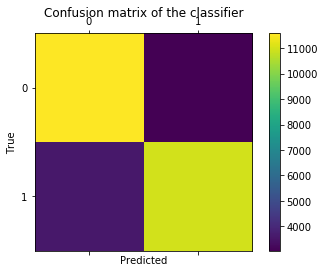

In [280]:
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV

cm = confusion_matrix(y_test, y_pred)
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(cm)
plt.title('Confusion matrix of the classifier')
fig.colorbar(cax)
#ax.set_xticklabels([''] + labels)
#ax.set_yticklabels([''] + labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

## 11. Решить задачу бинарной классификации и предсказать удовлетворение клиентов банка (переменная TARGET)



In [349]:
test = pd.read_csv('test.csv')

In [350]:
important_features_rfe_test = important_features_rfe[:49]

In [351]:
df_class_1_over = df_class_1.sample(count_class_0, replace=True)
rfe_over = pd.concat([df_class_0, df_class_1_over], axis=0)

print('Random over-sampling:')
print(rfe_over.TARGET.value_counts())

Random over-sampling:
1    73012
0    73012
Name: TARGET, dtype: int64


In [352]:
X2_test = test[important_features_rfe_test]

In [353]:
X2_test_over = rfe_over['TARGET']
X2_test_over = rfe_over.drop(columns=['TARGET'])

In [354]:
X2_test_over = preprocessing.normalize(X2_test)

In [363]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

X = X_train
y = y_train

model = XGBClassifier()
model.fit(X, y)
y_pred = model.predict(X2_test)

In [364]:
submit = test[['ID']]
submit['TARGET'] = y_pred
submit.to_csv('submit_santander_knn.csv', index=False)